# Figure 2

This code holds the data visualisation fo figure 1

In [1]:
using DelimitedFiles
using Plots
using Measures
using StatsBase

## Tension curves

In [2]:
files_cycles = readdir("data/cycles");
files_creep = readdir("data/creep");

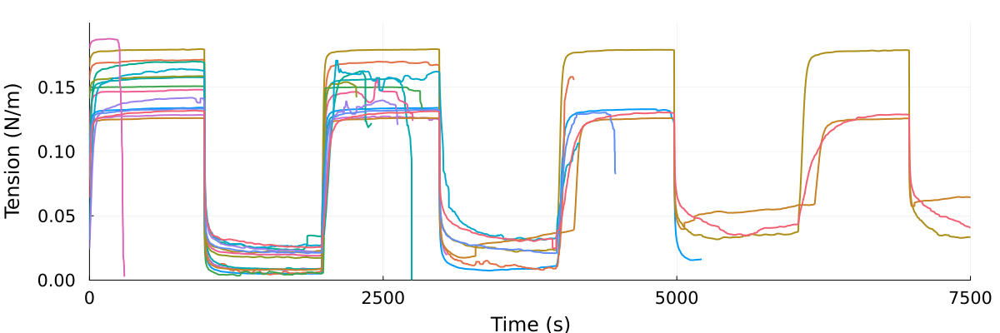

In [3]:
p1 = plot(legend=false, xlabel="Time (s)", ylabel="Tension (N/m)", size=(800,300), margins=5Plots.mm)
for filename in files_cycles
    # read file
    data = readdlm("data/cycles/" * filename, '\t')
    time = data[:,1]
    stress = data[:,2]
    plot!(p1, time, stress, label=filename, linewidth=2)
end
plot!(p1;
    ylims = (0, 0.2),
    xlims = (0, 7500),
    size = (1200, 400),
    legend = false,
    xtickfontsize = 14,
    ytickfontsize = 14,
    xlabel = "Time (s)",
    ylabel = "Tension (N/m)",
    xguidefontsize = 16,
    yguidefontsize = 16,
    leftmargin = 7mm,
    bottommargin = 7mm,
    rightmargin = 7mm,
)

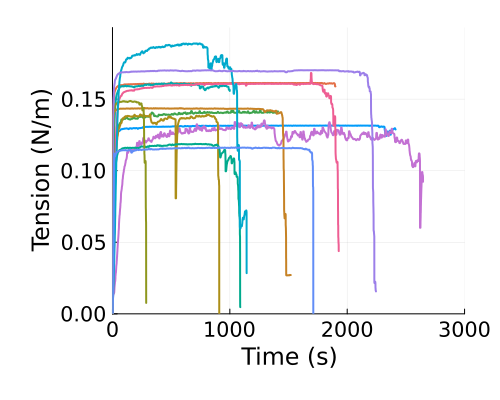

In [4]:
p1 = plot(legend=false, xlabel="Time (s)", ylabel="Tension (N/m)", size=(800,300), margins=5Plots.mm)
for filename in files_creep
    # read file
    data = readdlm("data/creep/" * filename, '\t')
    time = data[:,1]
    stress = data[:,2]
    plot!(p1, time, stress, label=filename, linewidth=2)
end
plot!(p1;
    ylims = (0, 0.2),
    xlims = (0, 3000),
    size = (500, 400),
    legend = false,
    xtickfontsize = 14,
    ytickfontsize = 14,
    xlabel = "Time (s)",
    ylabel = "Tension (N/m)",
    xguidefontsize = 16,
    yguidefontsize = 16,
    leftmargin = 7mm,
    bottommargin = 7mm,
    rightmargin = 7mm,
)

## Scatter plots of tension and strain

In [2]:
using DataFrames
using StatsPlots; gr()

filename = "data/processed_data.csv"

# Read the data
data, header = readdlm(filename, ',', header=true)
df = DataFrame(data, vec(Symbol.(header)));
df.t_gamma_high = df.t_gamma_high .* 60;  # convert minutes to seconds
df.gamma_high = df.gamma_high ./ 1e4;  # convert to N/m

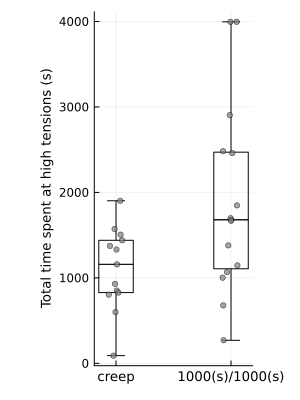

In [6]:
df_plot = filter(row -> row.label in (1, 2), df)
# Create the plot explicitly (not inside @df)
p = boxplot(df_plot.label, df_plot.t_gamma_high;
    xlabel = "",
    ylabel = "Total time spent at high tensions (s)",
    guidefont = font(9), 
    title = "",
    left_margin = 10mm,
    right_margin = 10mm,
    legend = false,
    xticks = ([1, 2], ["creep", "1000(s)/1000(s)"]),
    xtickfont = font(9),
    fillcolor = nothing,
    outlier = false,
    bar_width = 0.3,
    size = (300, 400),
)

# Overlay jittered scatter
scatter!(df_plot.label .+ 0.15 .* (rand(length(df_plot.label)) .- 0.5), df_plot.t_gamma_high,;
    color = :grey,
    markerstrokecolor = :black,
    markersize = 3,
    alpha = 0.7,
)
display(p)

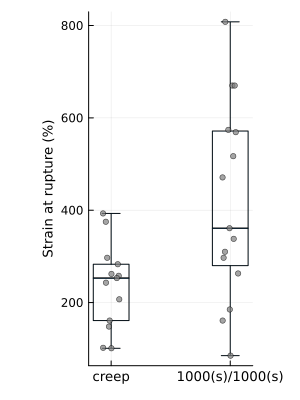

In [7]:
df_plot = filter(row -> row.label in (1, 2), df)
# Create the plot explicitly (not inside @df)
p = boxplot(df_plot.label, df_plot.rupture_strain;
    xlabel = "",
    ylabel = "Strain at rupture (%)",
    guidefont = font(9), 
    title = "",
    left_margin = 10mm,
    right_margin = 10mm,
    legend = false,
    xticks = ([1, 2], ["creep", "1000(s)/1000(s)"]),
    xtickfont = font(9),
    fillcolor = nothing,
    outlier = false,
    bar_width = 0.3,
    size = (300, 400),
)

# Overlay jittered scatter
scatter!(df_plot.label .+ 0.15 .* (rand(length(df_plot.label)) .- 0.5), df_plot.rupture_strain,;
    color = :grey,
    markerstrokecolor = :black,
    markersize = 3,
    alpha = 0.7,
)
display(p)

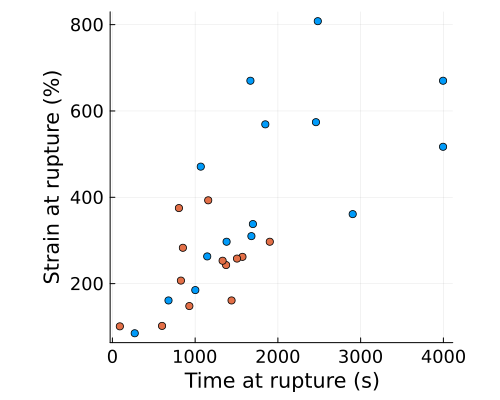

In [8]:
df_plot = filter(row -> row.label in (1, 2), df)
# Create the plot explicitly (not inside @df)
p = scatter(df_plot.t_gamma_high[df_plot.label.==2.], df_plot.rupture_strain[df_plot.label.==2.];
    xlabel = "Time at rupture (s)",
    ylabel = "Strain at rupture (%)",
    guidefont = font(14), 
    title = "",
    left_margin = 10mm,
    right_margin = 10mm,
    legend = false,
    xtickfont = font(12),
    ytickfont = font(12),
    size = (500, 400),
    label = "cycles",
)
scatter!(p, df_plot.t_gamma_high[df_plot.label.==1.], df_plot.rupture_strain[df_plot.label.==1.];
    label = "creep",
)
xlabel!("Time at rupture (s)", labelfont=font(12))

display(p)


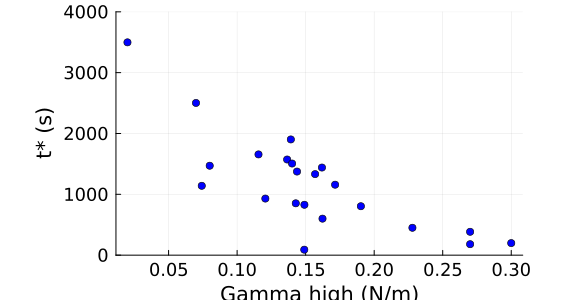

"/home/ep670/Documents/JunctionHealing/figures/2c.svg"

In [5]:
df_plot = filter(row -> row.label in (1, 0), df)
# Create the plot explicitly (not inside @df)
p = scatter(df_plot.gamma_high, df_plot.t_gamma_high;
    xlabel = "Gamma high (N/m)",
    ylabel = "t* (s)",
    guidefont = font(14), 
    title = "",
    left_margin = 10mm,
    right_margin = 10mm,
    legend = false,
    xtickfont = font(12),
    ytickfont = font(12),
    size = (570, 300),
    label = "cycles",
    ylims = (0, 4000),
    color="blue"
)
display(p)
savefig("figures/2c.svg")